# Filterbank Code

## Aim
- To get the frequency spectrum for the harmonics present based on Bird Frequency range
* Input:
    - Wav file

* Output:
    - Fundamental pitch of Bird frequency in Hz based on Melodic notes

In [6]:
import librosa
from IPython.display import Audio as dAud
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

/Users/saksham/opt/anaconda3/envs/R-main/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
/Users/saksham/opt/anaconda3/envs/R-main/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit


In [ ]:
# How high should the filter resolution be?

# Assuming sample rate is at 22000 rate
# We have max filter value of 11000 Hz available

# If I take 22000 samples, that will give 11000 points in FFT for each bucket

# If my window function is smaller: I can take a rolling window of say 50 ms ie 0.05*22000 samples i.e. window size of 1100
    

In [2]:
sr = 22000
print(sr*0.05)

1100.0


In [ ]:
Now 1100 samples is the amount of data I have in the window
If I want a resolution of 1Hz then I need to have 22000 samples - i.e zero pad to length 22000

What is the difference in notes in the 1khz to 8khz range?

In [19]:
librosa.core.hz_to_note(1000)

'B5'

In [17]:
librosa.core.note_to_hz("A9")

14080.0

In [ ]:
So assuming 1000 Hz to 8000 Hz
We have range from B5 to B8

In [24]:
librosa.core.note_to_midi("B8")

119

In [ ]:
MIDI notes in range of 83 to 119

In [27]:
freq_list = []

for i in range(83,120):
    freq_list.append([librosa.core.midi_to_note(i),librosa.core.midi_to_hz(i)])

In [32]:
(freq_list[0][1] - freq_list[1][1])/4

-14.68391467253656

In [ ]:
so 58 Hz difference between first note.
So if we take a quarter of that as resolution 
we need 58/4 = 14.6 hz resolution in each bin

In [103]:
22050/14.6

1510.2739726027398

In [ ]:
1500 bins I need for each bin to have content of 14Hz apart
Which should make it possible to find the bins in which the frequency fundamental is highest and map that to a MIDI note


In [41]:
1300*22050/1500 

19110.0

In [37]:
x, fs = librosa.load("../../songs/songs/xc101371.flac")

/Users/saksham/opt/anaconda3/envs/R-main/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


In [38]:
print(fs)


22050


In [43]:
dAud(data=x,rate=fs)

In [44]:
x2 = x[0:fs]

In [46]:
x2 is one second long
It contains 20 0.05 second long sections
If I want an overlap of 0.025 seconds, then I have 40 total sections

22050

In [49]:
hop_size = int(0.025*fs)
win_size = int(0.05*fs)
print(hop_size,win_size)

551 1102


In [53]:
total_windows = len(x2)/hop_size
print(total_windows)

40.01814882032668


In [75]:
for i in range(int(total_windows)):
#     print(i)
    if(i ==11):
        
        y = x2[i*hop_size:i*hop_size + win_size]
        print(i,len(y))

11 1102


In [76]:
dAud(data=y,rate=fs)

In [80]:
y2 = np.hanning(win_size)*y

In [81]:
dAud(data=y2,rate=fs)

In [82]:
# Now let us look at the FFT of this by padding it with zeros to length = 1500

In [84]:
len(y2)

1102

In [99]:
nFFT = 1500
padwidth = nFFT - len(y2)
print(padwidth)
y3 = np.append(y2,np.zeros(padwidth))

398


In [101]:
dAud(data=y3,rate=fs)

In [104]:
f1 = np.fft.fft(y3)

/Users/saksham/opt/anaconda3/envs/R-main/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


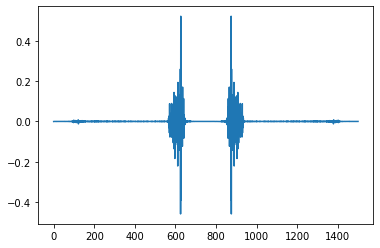

In [109]:
plt.plot(f1)

In [114]:
f2 = f1[0:int(nFFT/2)]

In [116]:
f3 = np.abs(f2)

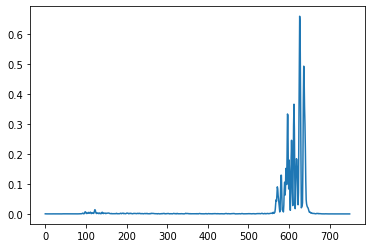

In [117]:
plt.plot(f3)

In [119]:
np.argmax(f3)


626

In [120]:
626*22050/1500

9202.2

In [122]:
librosa.core.hz_to_note(9202)

'D9'

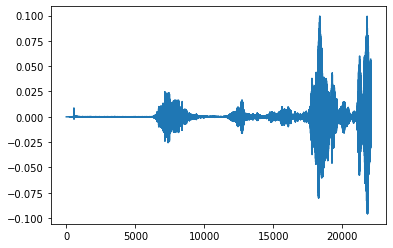

In [142]:
plt.plot(x2)

In [149]:
# Where is the value?
# signal_rmse = librosa.feature.rms(x2,hop_length=len(x2))
# print(signal_rmse[0])

[0.00038619 0.03764159]


In [146]:
librosa.feature.rms?

In [154]:
nFFT = 1500
cutoff_rms = 0.02
freq_outputs = []
energy_vals = []

for i in range(int(total_windows)):
    y = x2[i*hop_size:i*hop_size + win_size]
    y2 = np.hanning(len(y))*y
    padwidth = nFFT - len(y2)
    y3 = np.append(y2,np.zeros(padwidth))
    f1 = np.fft.fft(y3)
    f2 = f1[0:int(nFFT/2)]
    f3 = np.abs(f2)
    binVal = np.argmax(f3)
    freq = binVal*fs/nFFT
    e_val = np.sqrt(np.sum(np.abs(y**2)))
    if(e_val > cutoff_rms):
        energy_vals.append(e_val)
        freq_outputs.append(freq)
    
    else:
        energy_vals.append(0)
        freq_outputs.append(0)
    

In [156]:
freq_outputs

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 9349.2,
 9202.2,
 8379.0,
 8820.0,
 9216.9,
 9187.5,
 8746.5,
 0,
 0,
 0,
 7599.9,
 7614.6,
 7541.1,
 7570.5,
 7497.0,
 7482.3,
 7217.7,
 7203.0,
 7217.7,
 7114.8,
 7335.3,
 7129.5,
 7350.0,
 7350.0,
 7350.0,
 7350.0,
 7364.7,
 7144.2,
 7247.1,
 7232.4]

In [158]:
# freq_outputs

In [166]:
dAud(data=x2, rate=fs)

In [159]:
freq_outputs2 = []
for i in range(0, len(freq_outputs)): 
    if (i % 2): 
        freq_outputs2.append(freq_outputs[i]) 

In [133]:
# freq_outputs2

In [169]:
mNotes = librosa.core.hz_to_midi(freq_outputs2)

In [170]:
# Getting Midi notes into format to play using JSON

mNotes

array([        -inf,         -inf,         -inf,         -inf,
               -inf, 121.6368406 , 120.90243872, 121.60916299,
               -inf,         -inf, 118.35831389, 118.2577579 ,
       118.05487659, 117.39626971, 117.18297328, 117.21870568,
       117.74602585, 117.74602585, 117.25436448, 117.4667885 ])

    TWINKLE_TWINKLE = {
      notes: [
        {pitch: 60, startTime: 0.0, endTime: 0.5},
        {pitch: 60, startTime: 0.5, endTime: 1.0},
        {pitch: 67, startTime: 1.0, endTime: 1.5},
        {pitch: 67, startTime: 1.5, endTime: 2.0},
        {pitch: 69, startTime: 2.0, endTime: 2.5},
        {pitch: 69, startTime: 2.5, endTime: 3.0},
        {pitch: 67, startTime: 3.0, endTime: 4.0},
        {pitch: 65, startTime: 4.0, endTime: 4.5},
        {pitch: 65, startTime: 4.5, endTime: 5.0},
        {pitch: 64, startTime: 5.0, endTime: 5.5},
        {pitch: 64, startTime: 5.5, endTime: 6.0},
        {pitch: 62, startTime: 6.0, endTime: 6.5},
        {pitch: 62, startTime: 6.5, endTime: 7.0},
        {pitch: 60, startTime: 7.0, endTime: 8.0},
      ],
      totalTime: 8
    };


In [173]:
import pandas as pd

In [176]:
pd.DataFrame(mNotes, columns=["pitch"]).to_clipboard()

## Generating Sine Wave

In [164]:
t = float(0.05)
timeRes = win_size

freq_data = freq_outputs2

output = np.empty(0)
for i in range(len(freq_data)):
#     print(i)
    samples = np.linspace(0,t,int(timeRes),endpoint=False)
    f = freq_data[i]
    if(f < 0):
        f = 0
    signal = np.sin((2 * np.pi * f ) * samples )*0.7 * np.hanning(len(signal))
    
    output = np.append(output,signal)

In [165]:
dAud(data=output,rate=fs)

## Modular Function

In [3]:
def GenerateBirdSynth(filePath):
    x, fs = librosa.load(filePath)
    
    hop_size = int(0.025*fs)
    win_size = int(0.05*fs)
#     print(hop_size,win_size)
    total_windows = len(x)/hop_size

    nFFT = 1500
    cutoff_rms = 0.02
    freq_outputs = []
    energy_vals = []

    for i in range(int(total_windows)):
        y = x[i*hop_size:i*hop_size + win_size]
        y2 = np.hanning(len(y))*y
        padwidth = nFFT - len(y2)
        y3 = np.append(y2,np.zeros(padwidth))
        f1 = np.fft.fft(y3)
        f2 = f1[0:int(nFFT/2)]
        f3 = np.abs(f2)
        binVal = np.argmax(f3)
        freq = binVal*fs/nFFT
        e_val = np.sqrt(np.sum(np.abs(y**2)))
        if(e_val > cutoff_rms):
            energy_vals.append(e_val)
            freq_outputs.append(freq)

        else:
            energy_vals.append(0)
            freq_outputs.append(0)
            
    return freq_outputs


In [13]:
def genSineWav(freq_data):
    t = float(0.05)
    sr = 22050
    win_size = int(0.05*sr)
    timeRes = win_size

    output = np.empty(0)
    for i in range(len(freq_data)):
        samples = np.linspace(0,t,int(timeRes),endpoint=False)
        f = freq_data[i]
        if(f < 0):
            f = 0
        signal = np.sin((2 * np.pi * f ) * samples )*0.7 * np.hanning(len(samples))

        output = np.append(output,signal)
        
    return output

In [7]:
f_1 = GenerateBirdSynth("../../songs/songs/xc102060.flac")

/Users/saksham/opt/anaconda3/envs/R-main/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


In [9]:
freq_outputs2 = []
for i in range(0, len(f_1)): 
    if (i % 2): 
        freq_outputs2.append(f_1[i]) 

In [14]:
o1 = genSineWav(freq_outputs2)

In [15]:
dAud(data=o1, rate=22050)

In [17]:
file_test = "../../songs/songs/xc102060.flac"
y,sr = librosa.load(file_test)
dAud(data=y,rate=sr)

/Users/saksham/opt/anaconda3/envs/R-main/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


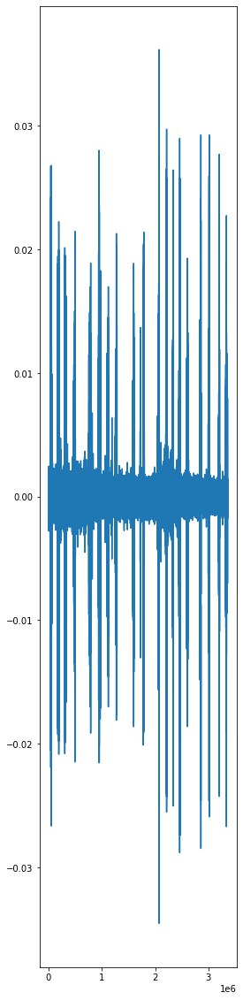

In [20]:
plt.figure(figsize=(4,20))
plt.plot(y)